In [2]:
try:
    import openmdao.api as om
    import dymos as dm
except ImportError:
    !python -m pip install openmdao[notebooks]
    !python -m pip install dymos[docs]
    import openmdao.api as om
    import dymos as dm

(examples:the_mountain_car_problem)=
# The Mountain Car Problem

The mountain car problem proposes a vehicle stuck in a "well."  It lacks the power to directly climb out of the well, but instead must accelerate repeatedly forwards and backwards until it has achieved the energy necessary to exit the well.

The problem is a popular machine learning test case, though the methods in Dymos are capable of solving it.
It first appeared in the PhD thesis of Andrew Moore in 1990. {cite}`moore1990efficient`.
The implementation here is based on that given by Melnikov, Makmal, and Briegel {cite}`melnikov2014projective`.

## State and control variables

This system has two state variables, the position ($x$) and velocity ($v$) of the car. 

This system has a single control variable ($u$), the effort put into moving.  This control is contrained to the range $[-1 \, 1]$.

The dynamics of the system are governed by

\begin{align}
  \dot{x} &= v \\
  \dot{v} &= 0.001 * u - 0.0025 * \cos(3 x)
\end{align}



## Problem Definition

We seek to minimize the time required to exit the well in the positive direction.

\begin{align}
    \mathrm{Minimize} \, J &= t_f
\end{align}

Subject to the initial conditions

\begin{align}
    x_0 &= -0.5 \\
    v_0 &= 0.0
\end{align}

the control constraints

\begin{align}
    |u| \le 1
\end{align}

and the terminal constraints

\begin{align}
    x_f &= 0.6 \\
    v_f &\ge 0.0
\end{align}

## Defining the ODE

The following code implements the equations of motion for the mountain car problem.

In [3]:
import numpy as np
import openmdao.api as om


class MountainCarODE(om.ExplicitComponent):
    
    def initialize(self):
        self.options.declare('num_nodes', types=int)
        
    def setup(self):
        nn = self.options['num_nodes']
        
        self.add_input('x', shape=(nn,), units='m')
        self.add_input('v', shape=(nn,), units='m/s')
        self.add_input('u', shape=(nn,), units='unitless')
        
        self.add_output('x_dot', shape=(nn,), units='m/s', tags=['dymos.state_rate_source:x'])
        self.add_output('v_dot', shape=(nn,), units='m/s**2', tags=['dymos.state_rate_source:v'])
        
        ar = np.arange(nn, dtype=int)
        
        self.declare_partials(of='x_dot', wrt='v', rows=ar, cols=ar, val=1.0)
        self.declare_partials(of='v_dot', wrt='u', rows=ar, cols=ar, val=0.001)
        self.declare_partials(of='v_dot', wrt='x', rows=ar, cols=ar)

    def compute(self, inputs, outputs):
        x = inputs['x']
        v = inputs['v']
        u = inputs['u']
        outputs['x_dot'] = v
        outputs['v_dot'] = 0.001 * u - 0.0025 * np.cos(3*x)

    def compute_partials(self, inputs, partials):
        x = inputs['x']
        partials['v_dot', 'x'] = 3 * 0.0025 * np.sin(3 * x)
        

In [4]:
import dymos as dm
from dymos.examples.plotting import plot_results
from dymos.examples.brachistochrone import BrachistochroneODE
import matplotlib.pyplot as plt

# The maximum absolute value of the acceleration authority of the car
U_MAX = 1.0

# The number of segments into which the problem is discretized
NUM_SEG = 50

#
# Initialize the Problem and the optimization driver
#
p = om.Problem()
               
p.driver = om.pyOptSparseDriver(optimizer='IPOPT')
p.driver.opt_settings['print_level'] = 5
p.driver.opt_settings['max_iter'] = 500
p.driver.opt_settings['nlp_scaling_method'] = 'gradient-based'  # for faster convergence

p.driver.declare_coloring()

driver_rec = om.SqliteRecorder('driver_rec.sql')
p.driver.add_recorder(driver_rec)

#
# Create a trajectory and add a phase to it
#
traj = p.model.add_subsystem('traj', dm.Trajectory())

tx = transcription=dm.Radau(num_segments=NUM_SEG)
gd = tx.grid_data

phase = traj.add_phase('phase0', dm.Phase(ode_class=MountainCarODE, transcription=tx))

#
# Set the variables
#
phase.set_time_options(fix_initial=True, duration_bounds=(.05, 10000), duration_ref=100)

phase.add_state('x', fix_initial=True, fix_final=False, lower=-1.2, upper=0.5, ref=1, defect_ref=1)
phase.add_state('v', fix_initial=True, fix_final=False, lower=-0.07, upper=0.07, ref=1, defect_ref=1)
phase.add_control('u', lower=-U_MAX, upper=U_MAX, ref=0.1, continuity=True, rate_continuity=False)

#
# Minimize time at the end of the phase
#
phase.add_objective('time', loc='final', ref=1000)

phase.add_boundary_constraint('x', loc='final', lower=0.5)
phase.add_boundary_constraint('v', loc='final', lower=0.0)
phase.add_path_constraint('u', lower=-U_MAX, upper=U_MAX)

p.model.linear_solver = om.DirectSolver()

#
# Setup the Problem
#
p.setup()

#
# Set the initial values
#
p['traj.phase0.t_initial'] = 0.0
p['traj.phase0.t_duration'] = 500.0

p.set_val('traj.phase0.states:x', phase.interp('x', ys=[-0.5, 0.5]))
p.set_val('traj.phase0.states:v', phase.interp('v', ys=[0, 1.0]))
p.set_val('traj.phase0.controls:u', np.sin(phase.interp('u', ys=[0, 1.0])))

#
# Solve for the optimal trajectory
#
dm.run_problem(p, run_driver=True, simulate=True, refine_method='ph', refine_iteration_limit=5)



--- Constraint Report [traj] ---
    --- phase0 ---
        [final]   5.0000e-01 <= x  [m]
        [final]   0.0000e+00 <= v  [m/s]
        [path]    -1.0000e+00 <= u <= 1.0000e+00  [unitless]

Model viewer data has already has already been recorded for Driver.
Model viewer data has already has already been recorded for Driver.


/Users/rfalck/Codes/OpenMDAO.git/openmdao/recorders/sqlite_recorder.py:223: UserWarning:The existing case recorder file, driver_rec.sql, is being overwritten.
/Users/rfalck/Codes/OpenMDAO.git/openmdao/recorders/sqlite_recorder.py:223: UserWarning:The existing case recorder file, dymos_solution.db, is being overwritten.


Full total jacobian was computed 3 times, taking 0.266727 seconds.
Total jacobian shape: (350, 451) 


Jacobian shape: (350, 451)  ( 1.65% nonzero)
FWD solves: 1   REV solves: 9
Total colors vs. total size: 10 vs 350  (97.1% improvement)

Sparsity computed using tolerance: 1e-25
Time to compute sparsity: 0.266727 sec.
Time to compute coloring: 0.459877 sec.

List of user-set options:

                                    Name   Value                used
                        file_print_level = 5                     yes
                   hessian_approximation = limited-memory        yes
                           linear_solver = mumps                 yes
                                max_iter = 500                   yes
                      nlp_scaling_method = gradient-based        yes
                             output_file = IPOPT.out             yes
                             print_level = 5                     yes
                      print_user_options = yes              

/Users/rfalck/anaconda3/envs/py39/lib/python3.9/site-packages/pyoptsparse/pyOpt_optimization.py:234: UserWarning: The argument `type=` is deprecated. Use `varType` in the future.
  warnings.warn("The argument `type=` is deprecated. Use `varType` in the future.")


   2  3.0130037e-01 1.74e-01 2.92e+03  -0.4 7.77e+00    -  1.35e-01 5.99e-01f  1
   3  2.9430181e-01 1.68e-01 3.47e+03  -0.1 6.03e+00    -  1.56e-01 3.37e-02f  1
   4  1.5653185e-01 9.04e-02 1.61e+03  -1.4 6.03e+00    -  1.50e-01 7.55e-01f  1
   5  1.8849684e-01 4.58e-02 9.38e+02  -0.4 1.56e+00    -  9.29e-02 3.86e-01f  1
   6  1.9282423e-01 3.79e-02 9.18e+02  -0.2 9.45e-01    -  9.48e-01 1.70e-01f  1
   7  2.1121653e-01 2.69e-02 6.35e+03   0.5 2.48e+00    -  1.00e+00 2.78e-01f  1
   8  2.5005841e-01 2.36e-02 3.21e+04   1.1 3.55e+00    -  9.10e-01 2.81e-01h  1
   9  2.4699220e-01 1.46e-02 1.18e+05   1.6 1.31e+01    -  1.00e+00 3.85e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.5606888e-01 4.79e-03 1.07e+05   1.5 1.39e+01    -  1.00e+00 6.63e-01h  1
  11  2.6657834e-01 7.90e-04 3.76e+04   0.9 4.76e+00    -  1.00e+00 8.47e-01h  1
  12  2.6978425e-01 6.32e-05 5.77e+03  -0.3 6.38e-01    -  1.00e+00 9.42e-01h  1
  13  2.6981277e-01 2.28e-07



          Grid Refinement - Iteration 0           
--------------------------------------------------
    Phase: traj.phases.phase0
        Refinement Options:
            Allow Refinement = True
            Tolerance = 0.0001
            Min Order = 3
            Max Order = 14
        Original Grid:
            Number of Segments = 50
            Segment Ends = [-1.0, -0.96, -0.92, -0.88, -0.84, -0.8, -0.76, -0.72, -0.68, -0.64, -0.6, -0.56, -0.52, -0.48, -0.44, -0.4, -0.36, -0.32, -0.28, -0.24, -0.2, -0.16, -0.12, -0.08, -0.04, 0.0, 0.04, 0.08, 0.12, 0.16, 0.2, 0.24, 0.28, 0.32, 0.36, 0.4, 0.44, 0.48, 0.52, 0.56, 0.6, 0.64, 0.68, 0.72, 0.76, 0.8, 0.84, 0.88, 0.92, 0.96, 1.0]
            Segment Order = [3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3]
            Error = [6.871e-08, 6.67e-08, 6.251e-08, 5.61e-08, 4.752e-08, 3.696e-08, 2.482e-08, 1.339e-05, 1.595e-07, 1.609e-07, 1.6

/Users/rfalck/Codes/OpenMDAO.git/openmdao/recorders/sqlite_recorder.py:223: UserWarning:The existing case recorder file, dymos_simulation.db, is being overwritten.


Done simulating trajectory traj


False

## Plotting the solution

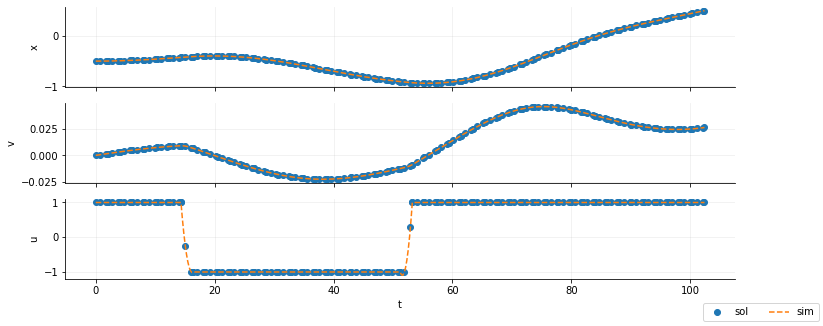

In [5]:
sol = om.CaseReader('dymos_solution.db').get_case('final')
sim = om.CaseReader('dymos_simulation.db').get_case('final')

t = sol.get_val('traj.phase0.timeseries.time')
x = sol.get_val('traj.phase0.timeseries.states:x')
v = sol.get_val('traj.phase0.timeseries.states:v')
u = sol.get_val('traj.phase0.timeseries.controls:u')
h = np.sin(3 * x) / 3

t_sim = sim.get_val('traj.phase0.timeseries.time')
x_sim = sim.get_val('traj.phase0.timeseries.states:x')
v_sim = sim.get_val('traj.phase0.timeseries.states:v')
u_sim = sim.get_val('traj.phase0.timeseries.controls:u')
h_sim = np.sin(3 * x_sim) / 3

import matplotlib.pyplot as plt

fig, axes = plt.subplots(3, 1, figsize=(12, 5), sharex=True)

sol_handle, = axes[0].plot(t, x, 'o', label='sol')
sim_handle, = axes[0].plot(t_sim, x_sim, '--', label='sim')
axes[0].set_ylabel('x')

axes[1].plot(t, v, 'o', label='sol')
axes[1].plot(t_sim, v_sim, '--', label='sim')
axes[1].set_ylabel('v')

axes[2].plot(t, u, 'o', label='sol')
axes[2].plot(t_sim, u_sim, '--', label='sim')
axes[2].set_ylabel('u')
axes[2].set_xlabel('t')

for a in axes:
    a.grid(True, alpha=0.2)
    a.spines['top'].set_visible(False)
    a.spines['right'].set_visible(False)
    
plt.figlegend(ncol=2, handles=[sol_handle, sim_handle], loc='lower right')

plt.show()

## Animated the Solution

The collapsed code cell below contains the code used to produce an animation of the mountain car solution using Matplotlib. This animation requires that `ffmpeg` be installed, but it can typically be installed from conda-forge or other package managers.

The green area represents the hilly terrain the car is traversing.  The black circle is the center of the car, and the orange arrow is the applied control.

The applied control _generally_ has the same sign as the velocity and is 'bang-bang', that is, it wants to be at its maximum possible magnitude.  Interestingly, the sign of the control flips shortly before the sign of the velocity changes.

Since nodes in the pseudospectral solution aren't necessarily evenly spaced in time, the solution using outputs from the simulation performed following the solution.  Since the _segments_ in the grid are evenly distributed, and have evenly spaced outputs, this results in an animation that accurately represents the motion of the system given the control inputs.

In [6]:
# if 'google.colab' in str(get_ipython()):
#     !apt install ffmpeg
# else:
#     print('Please install ffmpeg in order to view the following animation.')

In [7]:
fig, ax = plt.subplots(1, 1, figsize=(8,4));

# set up the subplots as needed
ax.set_xlim((-1.75, 0.75));          
ax.set_ylim((-0.5, 0.5));
ax.set_xlabel('x');
ax.set_ylabel('h');


txt_title = ax.set_title('')
x_terrain = np.linspace(-1.75, 0.75, 100);
h_terrain = np.sin(3 * x_terrain) / 3;
terrain_line, = ax.plot(x_terrain, h_terrain, '-', color='tab:gray', lw=2);
terrain = ax.fill_between(x_terrain, h_terrain, -0.5*np.ones_like(x_terrain), color='tab:green');
car, = ax.plot([], [], 'ko', ms=12);
u_vec = ax.quiver(x_sim[0] + 0.005, h_sim[0] + 0.005, u_sim[0], [0], scale=10, angles='uv', color='tab:orange')

# See https://brushingupscience.com/2019/08/01/elaborate-matplotlib-animations/ for quiver animation

def drawframe(n):
    _n = min(n, t_sim.size - 1)
    x = x_sim[_n]
    v = v_sim[_n]
    u = u_sim[_n]
    t = t_sim[_n]
    h = np.sin(3 * x) / 3 + 0.025
    car.set_data(x, h)
    txt_title.set_text(f'time = {t[0]:6.4f}  x = {x[0]:6.4f}  v = {v[0]:6.4f}  u = {u[0]:6.4f}')
    
    dh_dx = np.cos(3 * x)

    u_vec.set_offsets(np.atleast_2d(np.asarray([x + 0.005, h + 0.005]).T))
    u_vec.set_UVC(u * np.cos(dh_dx), u * np.sin(dh_dx))
    
    return car, u_vec

from matplotlib import animation

# blit=True re-draws only the parts that have changed.
# repeat_delay has no effect when using to_jshtml, so pad drawframe to show the final frame for 100 extra frames.
anim = animation.FuncAnimation(fig, drawframe, frames=t_sim.size + 100, interval=20, blit=True, repeat_delay=3);
plt.close()  # Don't let jupyter display the un-animated plot

from IPython.display import HTML
HTML(anim.to_jshtml())